# Lactate Discordance Project
## Data Cleaning and Exploratory Analysis
### C.V. Cosgriff, MIT Critical Data

The goal of this notebook is to clean the data and develop a general feel for the data that was extracted.

Outline:
* General cohort exploration
* Data cleaning for impending modeling
* Generation of target labels
* Further xploratory data analysis

## Step 0: Environment Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties # for unicode fonts
from sklearn.linear_model import LinearRegression

cohort = pd.read_csv('../extraction/cohort.csv')

# "Tableau 20" colors as RGB.   
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]  
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)

marker = ['v','o','d','^','s','>','+']
ls = ['-','-','-','-','-','s','--','--']

# configure matplotlib
plt.rcParams.update({'font.size': 22})
plt.style.use('classic')
plt.rcParams.update({'figure.max_open_warning': 0})

# configure jupyter for using matplotlib
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

## Step 1: General Exploration

How many patients in the cohort?

In [2]:
cohort.patientunitstayid.size

50459

What is the average age in the cohort?

In [3]:
cohort.age.mean()

62.355397451396186

What is the gender split? Note that gender was turned into a binary variable `male_gender` on extraction.

In [4]:
cohort.male_gender.mean()

0.5323926356051448

53.35%; fairly balanced

How is the ethnicity variable coded?

In [5]:
cohort.ethnicity = cohort.ethnicity.astype('category')
cohort.ethnicity.cat.categories

Index(['African American', 'Asian', 'Caucasian', 'Hispanic', 'Native American',
       'Other/Unknown'],
      dtype='object')

And what is the ethnicity distribution like?

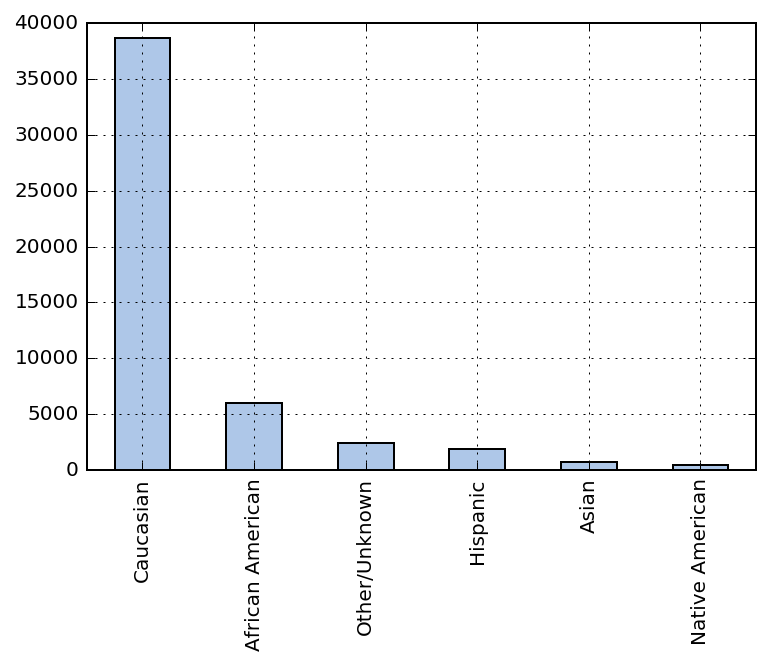

In [6]:
cohort.ethnicity.value_counts().plot.bar(color = tableau20[1], grid = True)

The cohort is predominately Caucasian. When we begin modeling, it may make sense to combine some of these categories.

How much missing data do we have?

In [7]:
with pd.option_context('display.max_rows', None, 'display.max_columns', 3):
    display(cohort.isna().sum())

patientunitstayid         0
age                       0
ethnicity               289
male_gender               0
hr_min                   11
hr_max                   11
hr_mean                  11
sbp_periodic_min      38194
sbp_periodic_max      38194
sbp_periodic_mean     38194
dbp_periodic_min      38207
dbp_periodic_max      38207
dbp_periodic_mean     38207
map_periodic_min      38108
map_periodic_max      38108
map_periodic_mean     38108
sbp_aperiodic_min       159
sbp_aperiodic_max       159
sbp_aperiodic_mean      159
dbp_aperiodic_min       168
dbp_aperiodic_max       168
dbp_aperiodic_mean      168
map_aperiodic_min       355
map_aperiodic_max       355
map_aperiodic_mean      355
rr_min                 3296
rr_max                 3296
rr_mean                3296
spo2_min                477
spo2_max                477
spo2_mean               477
tempc_min             44039
tempc_max             44039
tempc_mean            44039
albumin_min            8155
albumin_max         

We note substantial missing data for periodic blood pressure recordings, periodic temperature recordings, and bands. Coagulation labs also have a high level of missing data, but to a lesser degree. We will be using gradient boosting, which is fairly robust to missing data, but will drop the periodic pressures and temperatures as well as the band counts.

In [8]:
del cohort['sbp_periodic_min']
del cohort['sbp_periodic_max'] 
del cohort['sbp_periodic_mean']
del cohort['dbp_periodic_min'] 
del cohort['dbp_periodic_max'] 
del cohort['dbp_periodic_mean']
del cohort['map_periodic_min'] 
del cohort['map_periodic_max'] 
del cohort['map_periodic_mean']
del cohort['tempc_min']
del cohort['tempc_max']
del cohort['tempc_mean']
del cohort['bands_min']
del cohort['bands_max']

What is the distribution of the disease groups?

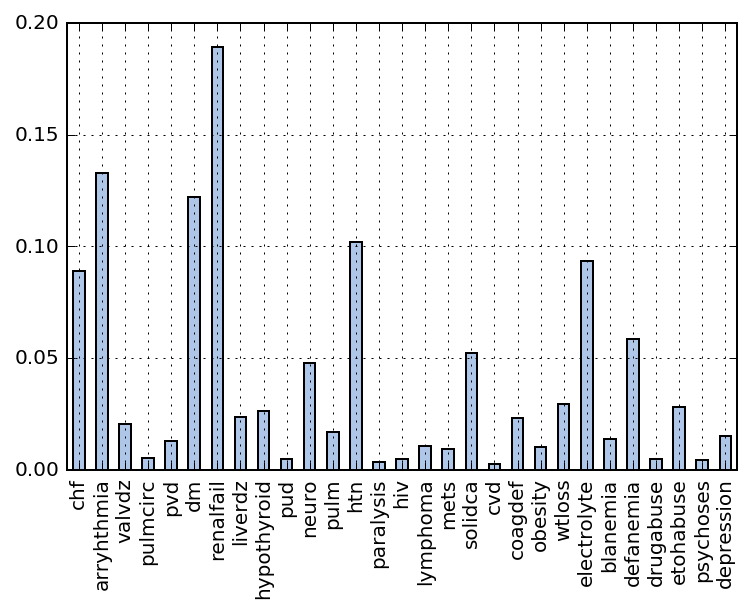

In [9]:
cohort.loc[:, 'chf':'depression'].mean().plot.bar(color = tableau20[1], grid = True)

The looks reasonable.

## Step 2: Cleaning

The vital signs and laboratory data are pulled with some auto sanity checks built in. However, there are likely to be numerous issues with the initial pull.

In [10]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    pd.set_option('display.float_format', lambda x: '%.3f' % x)
    display(cohort.describe().T[['min', 'max']])

,min,max
patientunitstayid,141203.000,3353254.000
age,16.000,89.000
male_gender,0.000,1.000
hr_min,0.000,167.000
hr_max,0.000,300.000
hr_mean,0.000,179.333
sbp_aperiodic_min,0.000,198.000
sbp_aperiodic_max,38.000,200.000
sbp_aperiodic_mean,36.000,198.000
dbp_aperiodic_min,0.000,100.000


The checks on vitals and labs are evident in some of the ranges above. We note some issues:
* There are patients with vitals of 0; do these represent code scenarios or data quality issues?
* We note some very large abnormalities in the labs. These are harder to call data quality problems however. For example, patients with very low WBC may represent severe lymphpenia; patients with massive platelet counts may have thrombocytosis
* We note an APACHE IVa score below 0 which cannot happen

We can examine these issues more deeply. We can start with vital signs. The min for rr_max is 0, suggesting there are patients who had their highest recorded respiratory rate as 0.

In [11]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cohort.loc[cohort.rr_max == 0, 'hr_min':'spo2_mean'])

,hr_min,hr_max,hr_mean,sbp_aperiodic_min,sbp_aperiodic_max,sbp_aperiodic_mean,dbp_aperiodic_min,dbp_aperiodic_max,dbp_aperiodic_mean,map_aperiodic_min,map_aperiodic_max,map_aperiodic_mean,rr_min,rr_max,rr_mean,spo2_min,spo2_max,spo2_mean
7209,90.000,120.000,98.416,111.000,160.000,136.000,55.000,88.000,70.840,78.000,98.000,88.900,0.000,0.000,0.000,91.000,100.000,96.581
7303,40.000,102.000,58.645,177.000,177.000,177.000,93.000,93.000,93.000,nan,nan,nan,0.000,0.000,0.000,98.000,100.000,99.983
8920,40.000,94.000,56.812,86.000,194.000,129.075,13.000,98.000,56.876,35.000,99.000,72.434,0.000,0.000,0.000,98.000,100.000,99.607
12822,68.000,119.000,81.986,81.000,108.000,94.096,46.000,68.000,56.747,62.000,81.000,69.892,0.000,0.000,0.000,97.000,100.000,98.282
18824,59.000,66.000,60.336,82.000,112.000,93.640,33.000,59.000,41.520,45.000,76.000,59.560,0.000,0.000,0.000,94.000,100.000,97.571
20853,100.000,136.000,110.181,103.000,133.000,119.842,55.000,70.000,60.368,75.000,90.000,82.632,0.000,0.000,0.000,83.000,100.000,95.946
25003,80.000,138.000,112.126,41.000,133.000,108.762,33.000,100.000,68.538,35.000,92.000,67.667,0.000,0.000,0.000,6.000,96.000,89.674
25044,0.000,135.000,53.000,68.000,109.000,79.500,20.000,67.000,39.500,41.000,76.000,53.000,0.000,0.000,0.000,39.000,73.000,55.125
29811,41.000,98.000,59.910,70.000,195.000,125.538,42.000,92.000,66.600,50.000,90.000,62.333,0.000,0.000,0.000,88.000,100.000,99.468
32121,70.000,144.000,120.571,47.000,53.000,50.333,28.000,32.000,30.333,35.000,37.000,36.167,0.000,0.000,0.000,79.000,81.000,79.600


We note that most of these patients have other vitals recorded around them. The patient at index 36813 has 0 for all periodic vitals and was probably never on a monitor; they could be dropped. This suggests a rule we could apply:
* If a patient has 0 for `hr_min`, `hr_max`, and `hr_mean` we will assume they were never on a monitor and exclude them

Such a rule would not be useful for respiratory rates because these are probably patients who never had the respiratory rate monitor on, but it was connected and reading 0. For these patients we should flip these to missing values. We can apply these rules and then re-evaluate.

In [12]:
print(cohort.shape)
no_monitor = (cohort.hr_min == 0) & (cohort.hr_max == 0) & (cohort.hr_mean == 0)
cohort = cohort[no_monitor == False]
print(cohort.shape)

(50459, 89)
(50458, 89)


Apparently, it was just that one guy.

In [13]:
no_resp = (cohort.rr_min == 0) & (cohort.rr_max == 0) & (cohort.rr_mean == 0)
cohort.loc[no_resp, ['rr_min', 'rr_max', 'rr_mean']] = np.nan

We can check the ranges again.

In [14]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    pd.set_option('display.float_format', lambda x: '%.3f' % x)
    display(cohort.describe().T[['min', 'max']])

,min,max
patientunitstayid,141203.000,3353254.000
age,16.000,89.000
male_gender,0.000,1.000
hr_min,0.000,167.000
hr_max,36.000,300.000
hr_mean,27.175,179.333
sbp_aperiodic_min,0.000,198.000
sbp_aperiodic_max,38.000,200.000
sbp_aperiodic_mean,36.000,198.000
dbp_aperiodic_min,0.000,100.000


I remain curious as to who had a respiratory rate of 1 as their maximum.

In [15]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cohort.loc[cohort.rr_max == 1, 'hr_min':'spo2_mean'])

,hr_min,hr_max,hr_mean,sbp_aperiodic_min,sbp_aperiodic_max,sbp_aperiodic_mean,dbp_aperiodic_min,dbp_aperiodic_max,dbp_aperiodic_mean,map_aperiodic_min,map_aperiodic_max,map_aperiodic_mean,rr_min,rr_max,rr_mean,spo2_min,spo2_max,spo2_mean
27542,77.000,113.000,98.979,74.000,161.000,102.939,48.000,88.000,68.980,59.000,97.000,79.543,0.000,1.000,0.003,95.000,100.000,99.829


This patient appears to have normal saturation values on his first day in the ICU, yet only achieves a a respiratory rate maximum of 1. This is arguably a data error, but may refer to a patient who was intubated and the rate set was not recorded. Lets take a look at a broader range of bradypnea.

In [16]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cohort.loc[cohort.rr_max <= 12, 'hr_min':'spo2_mean'])

,hr_min,hr_max,hr_mean,sbp_aperiodic_min,sbp_aperiodic_max,sbp_aperiodic_mean,dbp_aperiodic_min,dbp_aperiodic_max,dbp_aperiodic_mean,map_aperiodic_min,map_aperiodic_max,map_aperiodic_mean,rr_min,rr_max,rr_mean,spo2_min,spo2_max,spo2_mean
2987,91.000,154.000,113.794,115.000,159.000,130.379,44.000,68.000,57.862,69.000,100.000,85.370,0.000,4.000,0.443,86.000,100.000,97.718
6807,66.000,121.000,81.164,79.000,123.000,102.800,51.000,66.000,60.200,60.000,87.000,76.200,3.000,10.000,7.900,93.000,100.000,96.777
8504,0.000,95.000,61.086,55.000,92.000,69.441,34.000,76.000,51.735,43.000,81.000,58.824,0.000,12.000,9.432,17.000,100.000,97.162
9619,53.000,84.000,67.757,107.000,183.000,130.667,51.000,81.000,61.556,74.000,95.000,84.667,0.000,7.000,3.667,89.000,99.000,95.309
11519,101.000,152.000,112.247,99.000,132.000,115.672,50.000,81.000,63.213,54.000,89.000,74.393,8.000,12.000,10.000,94.000,100.000,99.390
12427,89.000,129.000,108.362,81.000,112.000,94.679,53.000,81.000,63.393,63.000,94.000,75.357,0.000,9.000,0.456,91.000,100.000,99.090
14053,70.000,105.000,85.603,67.000,173.000,113.333,45.000,90.000,60.020,51.000,97.000,71.929,11.000,11.000,11.000,95.000,100.000,97.136
18815,67.000,128.000,89.106,34.000,137.000,102.079,28.000,71.000,55.968,33.000,95.000,73.825,0.000,2.000,0.032,84.000,100.000,98.235
20196,50.000,96.000,60.109,97.000,154.000,130.000,61.000,96.000,75.000,75.000,100.000,88.200,7.000,10.000,9.400,95.000,100.000,98.667
20859,72.000,107.000,89.196,84.000,149.000,117.320,44.000,83.000,64.120,53.000,100.000,77.500,0.000,9.000,0.034,89.000,100.000,97.858


Overall, I expect these respiratory rate recordings are a very messy data feed. However, as the classifier we intend to make would be based off a live feed from the EHR and monitor systems it may be reasonable to leave these in. I'm unwilling to play guessing games about who had legitimate recordings and who did not past calling all 0s across readings `NA`. 

However, as a data quality check, it would be reasonable to exclude patients with no aperiodic blood pressure recorded. Automated cuff pressures are usually pretty bad, and patients who had no aperiodic checks recorded can be excluded. Implementation of this classifier would thus require you had a blood pressure recorded (which is not unreasonable).

In [17]:
no_aperiodic =  np.isnan(cohort.sbp_aperiodic_min) & np.isnan(cohort.sbp_aperiodic_max) & \
np.isnan(cohort.sbp_aperiodic_mean) & np.isnan(cohort.dbp_aperiodic_min) & \
np.isnan(cohort.dbp_aperiodic_max) & np.isnan(cohort.dbp_aperiodic_mean) & \
np.isnan(cohort.map_aperiodic_min) & np.isnan(cohort.map_aperiodic_max) & \
np.isnan(cohort.map_aperiodic_mean)

print(cohort.shape)
cohort = cohort[no_aperiodic == False]
print(cohort.shape)

(50458, 89)
(50314, 89)


Before concluding with the vitals, we should examine the patients with a MAP minimum of 0.

In [18]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cohort.loc[cohort.map_aperiodic_min == 0, 'hr_min':'spo2_mean'])

,hr_min,hr_max,hr_mean,sbp_aperiodic_min,sbp_aperiodic_max,sbp_aperiodic_mean,dbp_aperiodic_min,dbp_aperiodic_max,dbp_aperiodic_mean,map_aperiodic_min,map_aperiodic_max,map_aperiodic_mean,rr_min,rr_max,rr_mean,spo2_min,spo2_max,spo2_mean
1608,0.000,127.000,85.965,0.000,134.000,98.480,0.000,97.000,50.204,0.000,100.000,68.520,10.000,21.000,15.053,0.000,100.000,77.722
7193,48.000,139.000,94.523,25.000,176.000,88.200,0.000,98.000,58.227,0.000,100.000,65.064,7.000,27.000,15.429,60.000,100.000,96.900
8118,0.000,137.000,112.788,28.000,165.000,104.903,0.000,100.000,43.048,0.000,86.000,43.000,0.000,56.000,40.491,22.000,100.000,85.076
8813,85.000,112.000,94.136,127.000,183.000,159.269,60.000,86.000,71.981,0.000,99.000,90.647,14.000,34.000,17.648,86.000,99.000,94.153
11035,76.000,152.000,110.192,0.000,196.000,79.941,0.000,99.000,39.839,0.000,96.000,42.114,0.000,23.000,13.776,0.000,100.000,84.675
14369,0.000,101.000,71.750,0.000,169.000,122.792,0.000,77.000,50.577,0.000,100.000,77.261,0.000,30.000,14.812,0.000,99.000,77.184
17290,65.000,112.000,99.964,60.000,140.000,91.879,10.000,86.000,35.190,0.000,79.000,51.517,nan,nan,nan,97.000,100.000,99.928
18645,58.000,149.000,90.241,0.000,170.000,109.539,0.000,88.000,54.276,0.000,100.000,68.183,0.000,52.000,27.123,89.000,100.000,97.274
18707,87.000,138.000,106.734,0.000,151.000,99.493,0.000,100.000,60.106,0.000,100.000,70.450,14.000,34.000,22.181,92.000,100.000,97.736
20430,77.000,163.000,107.095,95.000,138.000,111.161,47.000,94.000,72.481,0.000,99.000,84.906,nan,nan,nan,83.000,100.000,96.527


Its hard to know why these patients have 0 values for their minimum pressures. There are not many of them, but I would rather not exclude them currently, because they may have been included to indicate a code scenario; this makes sense when they have`HR_min` of 0, but less so when their HR appears normal. 

Overall, these seem like reasonable quality decisions for the vitals for this preliminary work. We can now trun to laboratory data. I'm first curious about the patient who had a maximum glucose of 6; lets look at patients with very low max glucose levels. We can start with an arbitrarily low level, e.g. 40.

In [19]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cohort.loc[cohort.glucose_max <= 40, 'albumin_min':'wbc_max'])

,albumin_min,albumin_max,bicarbonate_min,bicarbonate_max,bilirubin_min,bilirubin_max,creatinine_min,creatinine_max,chloride_min,chloride_max,glucose_min,glucose_max,hematocrit_min,hematocrit_max,hemoglobin_min,hemoglobin_max,lactate_min,lactate_max,platelet_min,platelet_max,potassium_min,potassium_max,ptt_min,ptt_max,inr_min,inr_max,pt_min,pt_max,sodium_min,sodium_max,bun_min,bun_max,wbc_min,wbc_max
5480,2.400,2.400,14.000,14.000,4.300,5.400,1.300,1.300,103.000,103.000,34.000,34.000,32.000,32.000,10.500,10.500,5.600,5.600,20.000,20.000,4.800,4.800,72.000,72.000,15.800,15.800,100.200,100.200,138.000,138.000,18.000,18.000,7.110,7.110
8389,2.600,2.600,11.000,11.000,1.400,1.400,0.950,0.950,107.000,107.000,16.000,16.000,19.300,29.900,5.400,8.900,12.900,12.900,25.000,41.000,2.800,2.800,102.000,102.000,3.000,4.100,33.100,42.800,143.000,143.000,3.000,3.000,0.400,1.700
9548,2.700,2.700,24.000,24.000,0.800,0.800,0.840,0.840,97.000,97.000,26.000,26.000,31.900,34.400,11.200,12.300,3.000,3.000,280.000,318.000,2.800,3.800,34.000,34.000,1.300,1.300,14.400,14.400,134.000,134.000,30.000,30.000,17.600,24.300
15964,nan,nan,16.000,16.000,nan,nan,2.610,2.610,94.000,94.000,35.000,38.000,28.800,28.800,9.100,9.100,17.100,17.100,208.000,208.000,6.400,6.700,nan,nan,1.800,1.800,18.400,18.400,131.000,131.000,59.000,59.000,24.900,24.900
21467,1.100,1.100,27.000,27.000,10.200,10.200,0.510,0.510,107.000,107.000,37.000,37.000,29.800,29.800,9.700,9.700,2.300,2.300,178.000,178.000,3.400,3.400,31.100,31.100,1.600,1.600,19.000,19.000,143.000,143.000,38.000,38.000,6.700,6.700
22812,1.200,2.100,14.000,14.000,0.500,0.600,4.100,5.090,98.000,102.000,6.000,6.000,31.400,31.400,10.500,10.500,7.300,14.500,355.000,355.000,3.300,8.000,nan,nan,nan,nan,nan,nan,134.000,136.000,62.000,63.000,14.900,14.900
28080,2.500,2.500,22.000,23.000,1.800,1.800,2.390,2.620,96.000,101.000,37.000,39.000,34.500,35.400,11.600,11.700,5.600,5.600,31.000,49.000,4.100,4.900,71.100,71.100,1.600,1.700,nan,nan,137.000,137.000,51.000,54.000,0.800,1.000
41192,nan,nan,11.000,11.000,17.500,17.500,2.660,2.660,109.000,109.000,39.000,39.000,18.200,18.200,5.600,5.600,21.100,21.100,42.000,42.000,4.400,4.400,nan,nan,9.200,9.200,100.500,100.500,141.000,141.000,53.000,53.000,7.300,7.300
41417,3.200,3.200,25.000,25.000,1.100,1.100,0.680,0.680,98.000,98.000,19.000,19.000,41.900,41.900,13.300,13.300,2.900,2.900,67.000,67.000,4.400,9.300,34.500,34.500,1.100,1.100,13.800,13.800,128.000,128.000,11.000,11.000,253.300,253.300
44962,1.600,2.400,11.000,11.000,8.200,8.600,1.600,1.700,99.000,108.000,29.000,29.000,22.100,27.600,7.500,9.400,12.600,16.300,65.000,84.000,4.600,5.300,54.300,54.300,2.200,3.000,25.100,33.700,133.000,140.000,33.000,36.000,1.700,3.300


So 6 is quite low, and then there are this very small population which have very low glucose levels. It may helpful to see the distribution of glucose levels.

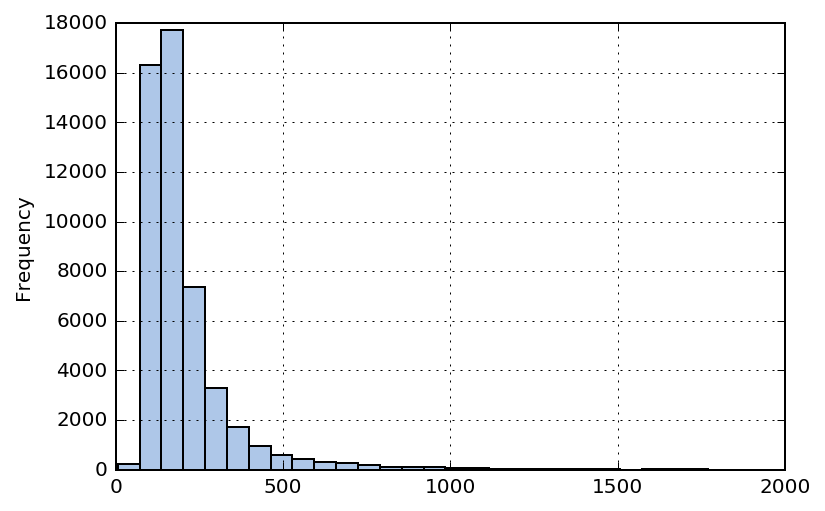

In [20]:
cohort.glucose_max.plot.hist(color = tableau20[1], grid = True, bins = 30)

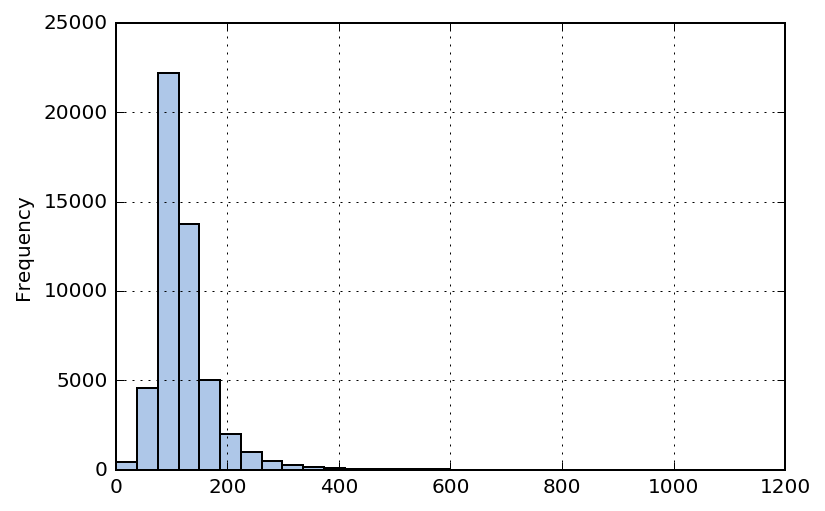

In [21]:
cohort.glucose_min.plot.hist(color = tableau20[1], grid = True, bins = 30)

We note that `glucose_max` is quite skewed and the `glucose_min` is skewed, but les so. Overall, the patients with very low glucose levels are a small population that could exist, but the patient with a level of 6 is most definetly an error. We'll convert his to `NA` but leave everyone else.

In [22]:
cohort.loc[cohort.glucose_max == 6, ['glucose_min', 'glucose_max']] = np.nan

Further perusal of the laboratory ranges above reveals no obviously absurd results, and, like the vitals, this is sufficient for this preliminary work. We next turn to some of the indicators. We can drop the `short_los` indicator, and our binary variables look fine. `apachescore` appears to have a minimum of -1. This is an issue as its minimum should be 0.

In [23]:
del cohort['short_los']
cohort.loc[cohort.apachescore < 0, 'patientunitstayid'].count()

279

I suspect that the eICU interface requires an APACHE IVa or autocalculates a score, and places a -1 in when the data are insufficient to determine the score. Because the APACHE IVa score will be used in generating the label, we'll exclude these patients.

In [24]:
print(cohort.shape)
cohort = cohort.loc[cohort.apachescore >= 0]
print(cohort.shape)

(50314, 88)
(50035, 88)


With these data cleaned, we can now turn to generation of the labels.

## Step 3: Label Generation

Discordance is defined as a `lactate_max` that is less than 2 mg/dL in patients in the highest quartile of the APACHE IVa distribution and a `lactate_max` that is greater than 4 mg/dL in the lowest quartile of the APACHE IVa distribution. We start by assigning each patient to the appropriate quartile.

In [25]:
apache_quartile = pd.qcut(cohort.apachescore, 4)
cohort = cohort.assign(apache_quartile = apache_quartile)

Then we define a discordance variable.

In [26]:
lactate_discordance = ((cohort.apache_quartile == apache_quartile.cat.categories[3]) & (cohort.lactate_max < 2)) | \
((cohort.apache_quartile == apache_quartile.cat.categories[0]) & (cohort.lactate_max > 4))
cohort = cohort.assign(lactate_discordance = lactate_discordance)

## Step 4: Exploratory Data Analysis

How many patients in the cohort are discordant?

Text(0.5,0,'Lactate Discordant')

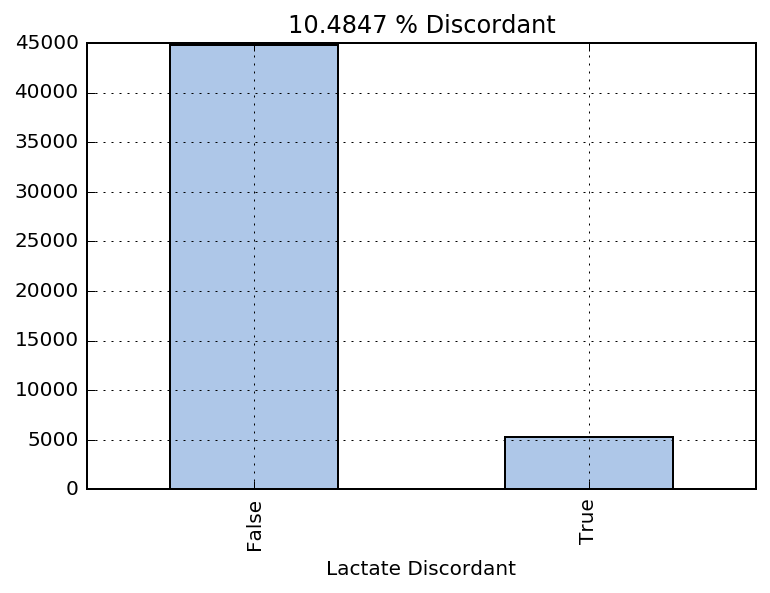

In [27]:
cohort.lactate_discordance.value_counts().plot.bar(color = tableau20[1], grid = True, x = 'Lactate Discordant', \
                                                   title = '{0:.{1}f} % Discordant'.format(np.mean(cohort.lactate_discordance)*100, \
                                                                                           4)).set_xlabel('Lactate Discordant')

Is there an obvious difference in the disease distribution between those who are discordant versus those who are not?

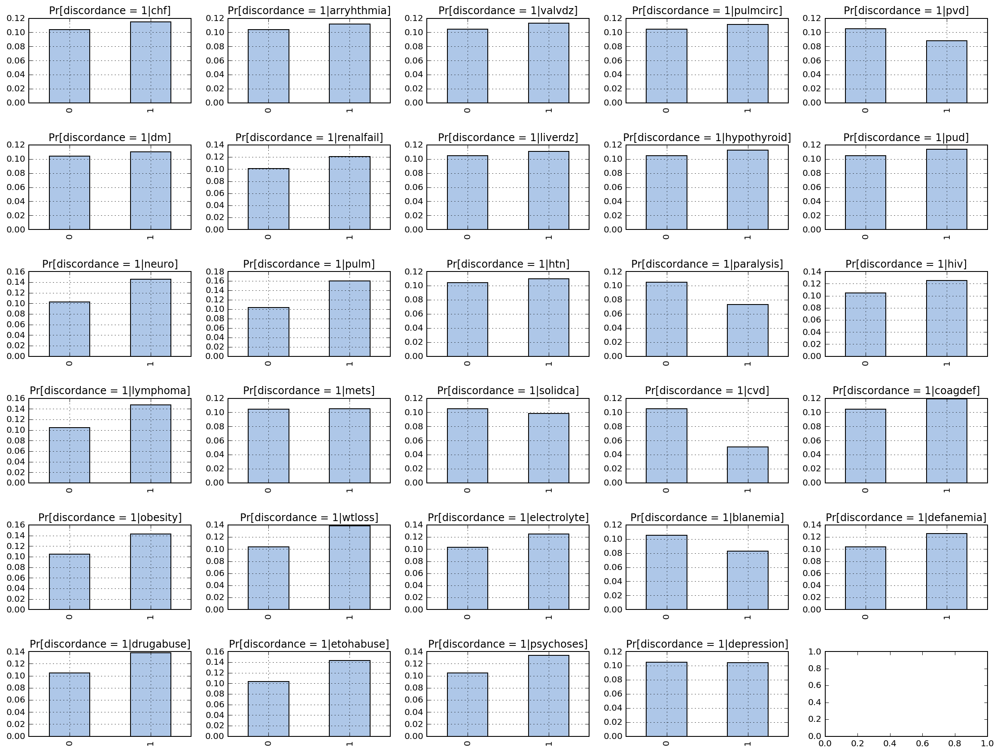

In [28]:
fig, axes = plt.subplots(nrows = 6, ncols = 5, figsize=(16, 12))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
for i, disease_group in enumerate(cohort.columns[59:88]):
    cohort.loc[:, [disease_group, 'lactate_discordance']].groupby(disease_group)\
    .mean().plot.bar(color = tableau20[1], grid = True, title = 'Pr[discordance = 1|' + disease_group + ']',\
                     legend = False, ax = axes[i // 5][i % 5]).get_xaxis().label.set_visible(False)

We note several differences. Of them, the majority of the disease processes result in higher discordance, although some, such as blood loss anemia actually appear to have less discordance. Discordance in the very sick may be different than discrodance in those with less severe disease, and so it may be worth examining the higher quartile and lower quartile seperately. We can start with the lowest quartile.

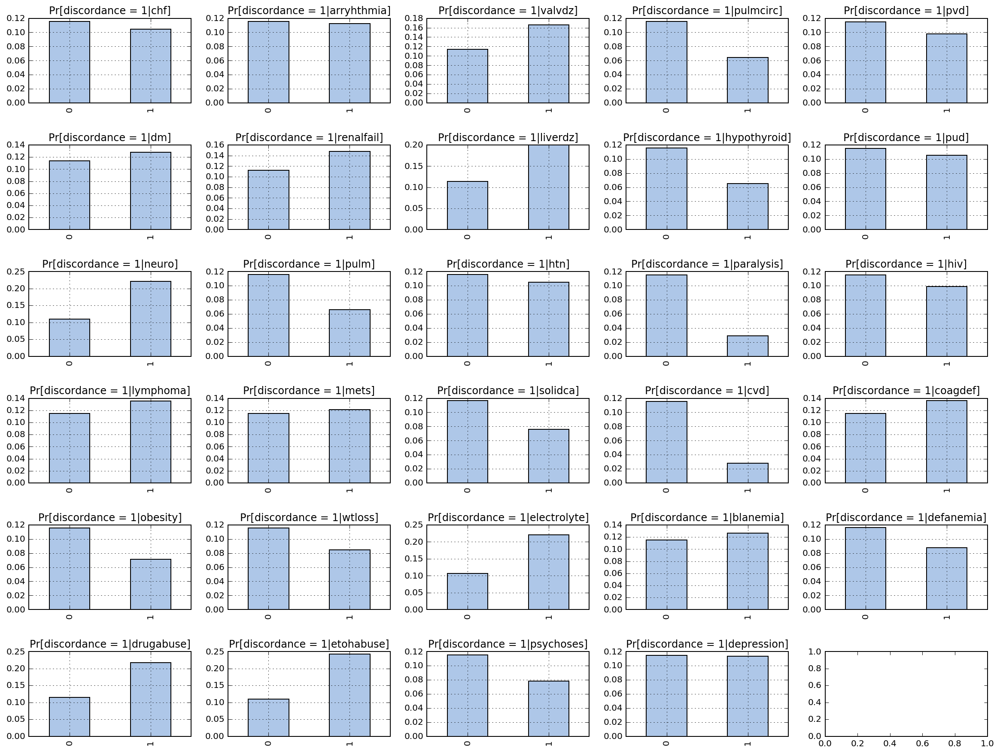

In [29]:
fig, axes = plt.subplots(nrows = 6, ncols = 5, figsize=(16, 12))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
for i, disease_group in enumerate(cohort.columns[59:88]):
    cohort.loc[cohort.apache_quartile == apache_quartile.cat.categories[0], [disease_group, 'lactate_discordance']].groupby(disease_group)\
    .mean().plot.bar(color = tableau20[1], grid = True, title = 'Pr[discordance = 1|' + disease_group + ']',\
                     legend = False, ax = axes[i // 5][i % 5]).get_xaxis().label.set_visible(False)

We note many differences and also that significant change in the pattern when conditioning on lowest quartile. Similarly we can examine the highest quartile.

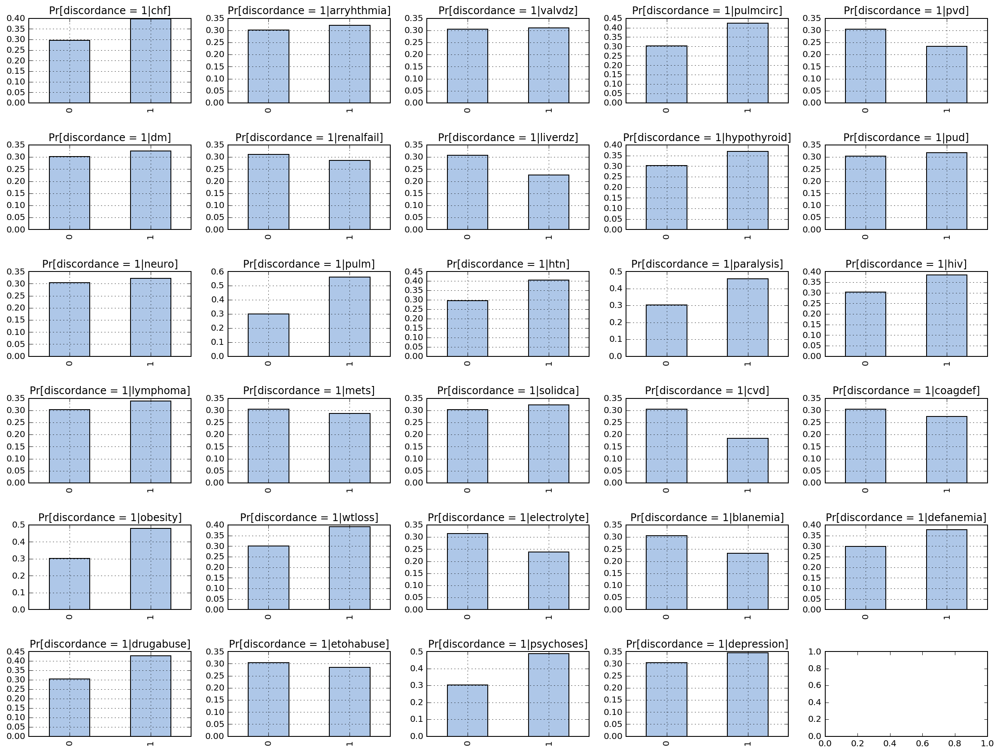

In [30]:
fig, axes = plt.subplots(nrows = 6, ncols = 5, figsize=(16, 12))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
for i, disease_group in enumerate(cohort.columns[59:88]):
    cohort.loc[cohort.apache_quartile == apache_quartile.cat.categories[3], [disease_group, 'lactate_discordance']].groupby(disease_group)\
    .mean().plot.bar(color = tableau20[1], grid = True, title = 'Pr[discordance = 1|' + disease_group + ']',\
                     legend = False, ax = axes[i // 5][i % 5]).get_xaxis().label.set_visible(False)

The next question to examine is how lactate levels, and therefore discordnace, would be associated with associated with vital signs. We'll start by examining `lactate_max` as a surrogate for discordance since we are examing the whole cohort. We will examine its association with vital signs, and then turn to the rest of the laboratory data.

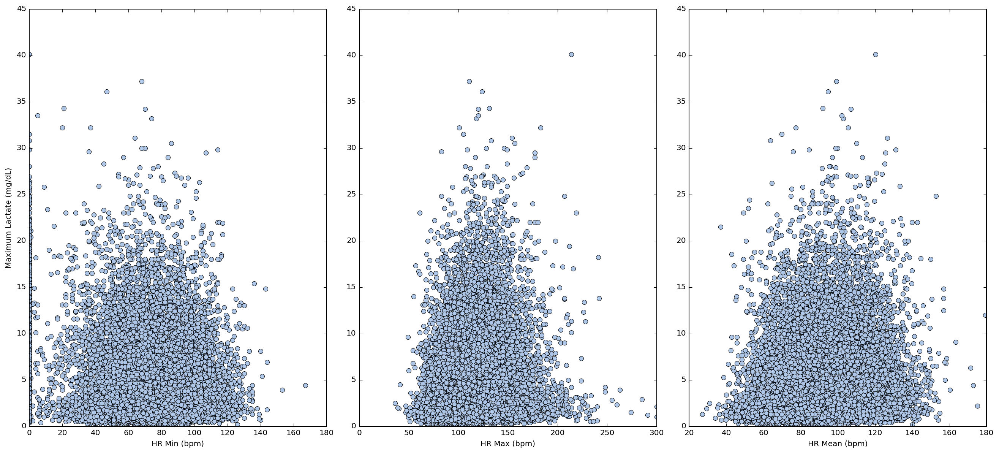

In [32]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(18, 8))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
axes[0].plot(cohort.hr_min, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[0].set_xlabel('HR Min (bpm)')
axes[0].set_ylabel('Maximum Lactate (mg/dL)')
axes[1].plot(cohort.hr_max, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[1].set_xlabel('HR Max (bpm)')
axes[2].plot(cohort.hr_mean, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[2].set_xlabel('HR Mean (bpm)')
plt.show()

No obvious linear relationship noted. We note that some of the highest lacttes we record tend towards the middle of the distribution. We will next look at MAP.

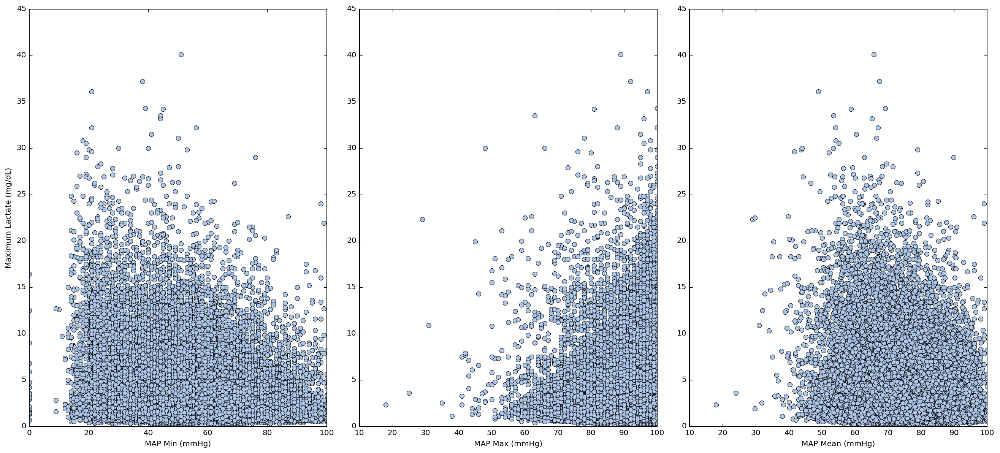

In [33]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(18, 8))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
axes[0].plot(cohort.map_aperiodic_min, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[0].set_xlabel('MAP Min (mmHg)')
axes[0].set_ylabel('Maximum Lactate (mg/dL)')
axes[1].plot(cohort.map_aperiodic_max, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[1].set_xlabel('MAP Max (mmHg)')
axes[2].plot(cohort.map_aperiodic_mean, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[2].set_xlabel('MAP Mean (mmHg)')
plt.show()

There are multiple notable points here. Chiefly, we have patients who have recorded MAP minimima of 0 with lactates below 5; these are likely reporting errors. People with severe shock in 20s see maxima in the 35-40 range on this chart, and so these patients at 0 may represent errors or may be interesting discordant cases. And now respiratory rate.

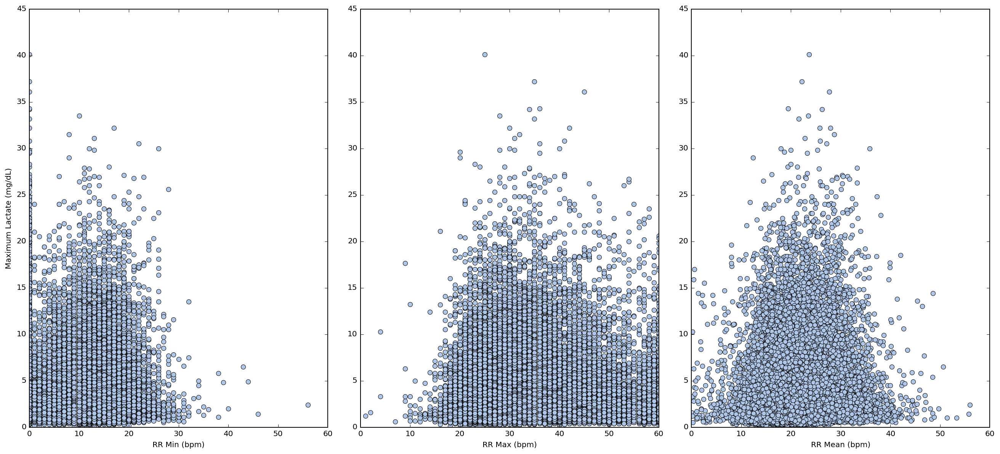

In [34]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(18, 8))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
axes[0].plot(cohort.rr_min, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[0].set_xlabel('RR Min (bpm)')
axes[0].set_ylabel('Maximum Lactate (mg/dL)')
axes[1].plot(cohort.rr_max, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[1].set_xlabel('RR Max (bpm)')
axes[2].plot(cohort.rr_mean, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[2].set_xlabel('RR Mean (bpm)')
plt.show()

Similar to the above. Lastly, lets examine saturation.

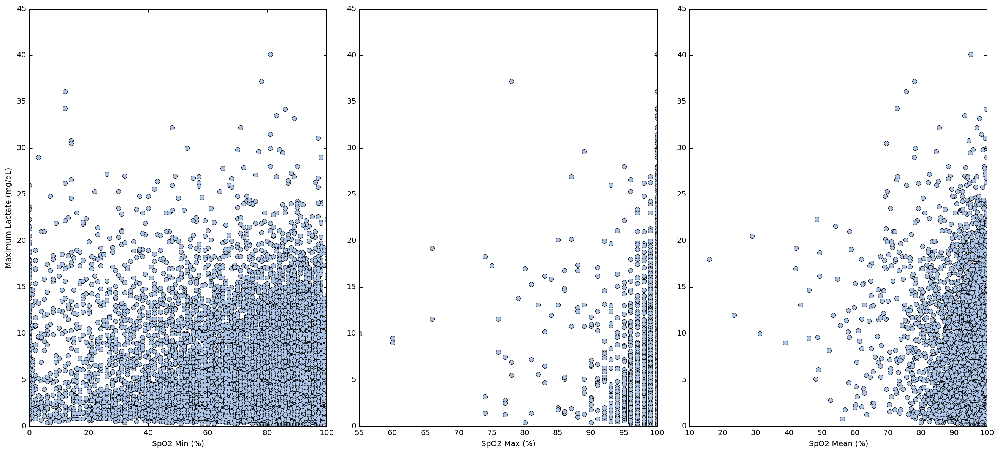

In [35]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(18, 8))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)
axes[0].plot(cohort.spo2_min, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[0].set_xlabel('SpO2 Min (%)')
axes[0].set_ylabel('Maximum Lactate (mg/dL)')
axes[1].plot(cohort.spo2_max, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[1].set_xlabel('SpO2 Max (%)')
axes[2].plot(cohort.spo2_mean, cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes[2].set_xlabel('SpO2 Mean (%)')
plt.show()

As expected, SpO2 is skewed. Association appears small. Overall, based upon visual inspection, vitals signs alone appear insufficiently associated with maximum lactate levels. However, taken together, they may be useful in the decision tree. We'll include them, and examine the importance matrix post-hoc to see if they are more helpful then they appear.

We can examine these correlations quantitatively

In [36]:
cohort.loc[:, 'hr_min':'spo2_mean'].corrwith(cohort.loc[:, 'lactate_max'])

hr_min               -0.072
hr_max                0.165
hr_mean               0.154
sbp_aperiodic_min    -0.209
sbp_aperiodic_max    -0.029
sbp_aperiodic_mean   -0.166
dbp_aperiodic_min    -0.183
dbp_aperiodic_max     0.000
dbp_aperiodic_mean   -0.097
map_aperiodic_min    -0.204
map_aperiodic_max    -0.045
map_aperiodic_mean   -0.161
rr_min               -0.057
rr_max                0.065
rr_mean               0.120
spo2_min             -0.243
spo2_max             -0.028
spo2_mean            -0.186
dtype: float64

As noted, all weak.

We next turn to the laboratory data. Because there are many more we'll loop through them as groups of laboatorties. We may begin with the chemistry (sodium, potassium, chloride, bicarbonate, creatinine, BUN).

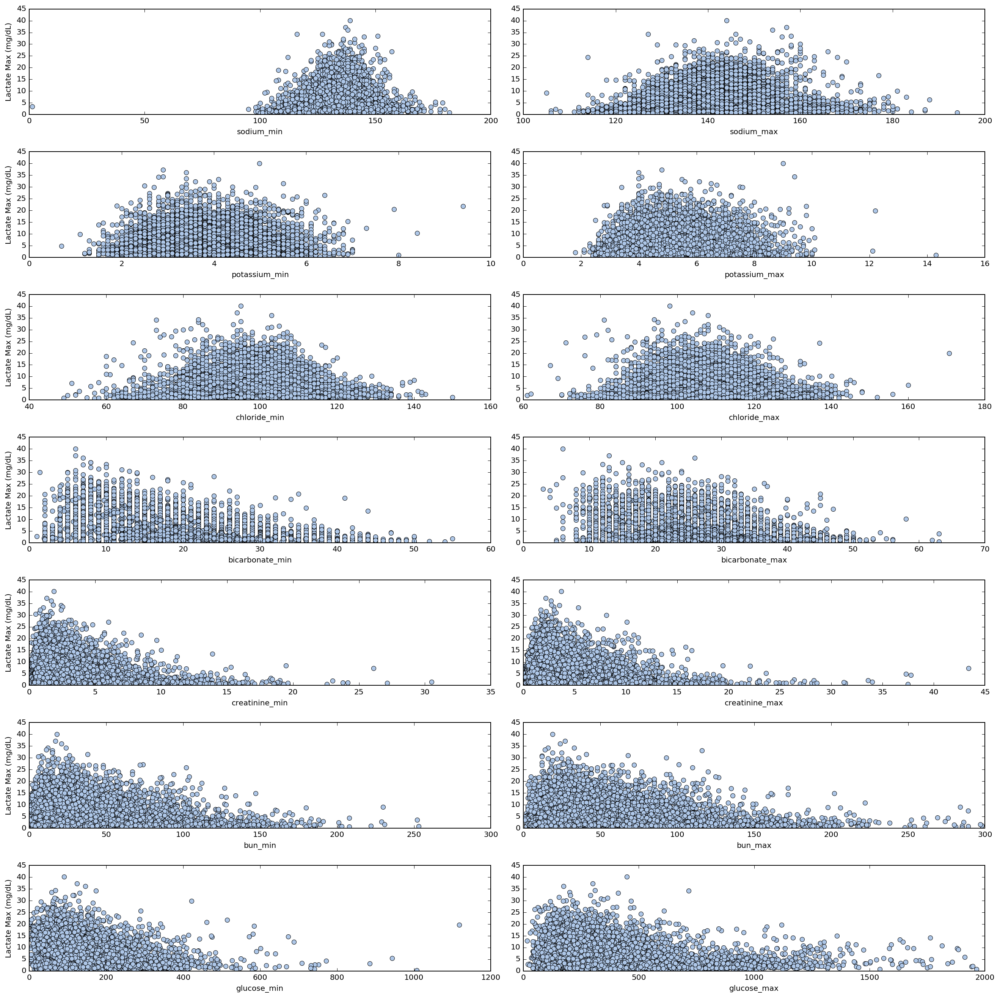

In [37]:
fig, axes = plt.subplots(nrows = 7, ncols = 2, figsize=(18, 18))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)

chemistry_vars = ['sodium_min', 'sodium_max', 'potassium_min', 'potassium_max',\
                  'chloride_min', 'chloride_max', 'bicarbonate_min', 'bicarbonate_max',\
                 'creatinine_min', 'creatinine_max', 'bun_min', 'bun_max',\
                 'glucose_min', 'glucose_max']

for i, lab in enumerate(chemistry_vars):
    axes[i // 2, i % 2].plot(cohort.loc[:, lab], cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
    axes[i // 2, i % 2].set_xlabel(lab)
    axes[i // 2, 0].set_ylabel('Lactate Max (mg/dL)')


plt.show()

In [38]:
cohort.loc[:, chemistry_vars].corrwith(cohort.loc[:, 'lactate_max'])

sodium_min        -0.007
sodium_max         0.129
potassium_min     -0.027
potassium_max      0.185
chloride_min      -0.065
chloride_max       0.047
bicarbonate_min   -0.378
bicarbonate_max   -0.213
creatinine_min     0.045
creatinine_max     0.076
bun_min            0.037
bun_max            0.057
glucose_min        0.032
glucose_max        0.167
dtype: float64

Overall, the chemistries are weakly correlated. The strongest is bicarbonate which we would expect given lactates role in acid-base status. We next turn to CBC.

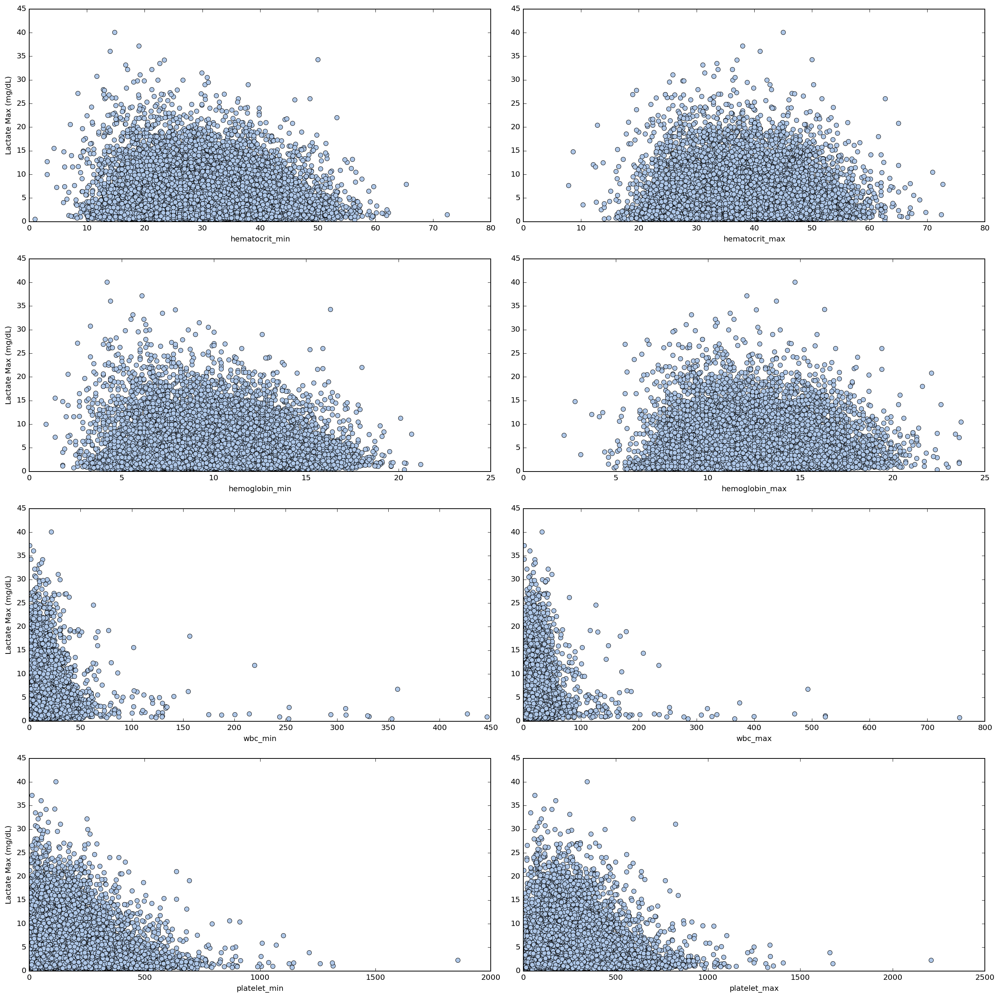

In [39]:
fig, axes = plt.subplots(nrows = 4, ncols = 2, figsize=(18, 18))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)

cbc_vars = ['hematocrit_min', 'hematocrit_max', 'hemoglobin_min', 'hemoglobin_max',\
                  'wbc_min', 'wbc_max', 'platelet_min', 'platelet_max']

for i, lab in enumerate(cbc_vars):
    axes[i // 2, i % 2].plot(cohort.loc[:, lab], cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
    axes[i // 2, i % 2].set_xlabel(lab)
    axes[i // 2, 0].set_ylabel('Lactate Max (mg/dL)')


plt.show()

In [40]:
cohort.loc[:, cbc_vars].corrwith(cohort.loc[:, 'lactate_max'])

hematocrit_min   -0.067
hematocrit_max    0.071
hemoglobin_min   -0.070
hemoglobin_max    0.065
wbc_min           0.047
wbc_max           0.128
platelet_min     -0.147
platelet_max     -0.044
dtype: float64

Again, all fairly weakly correlated.

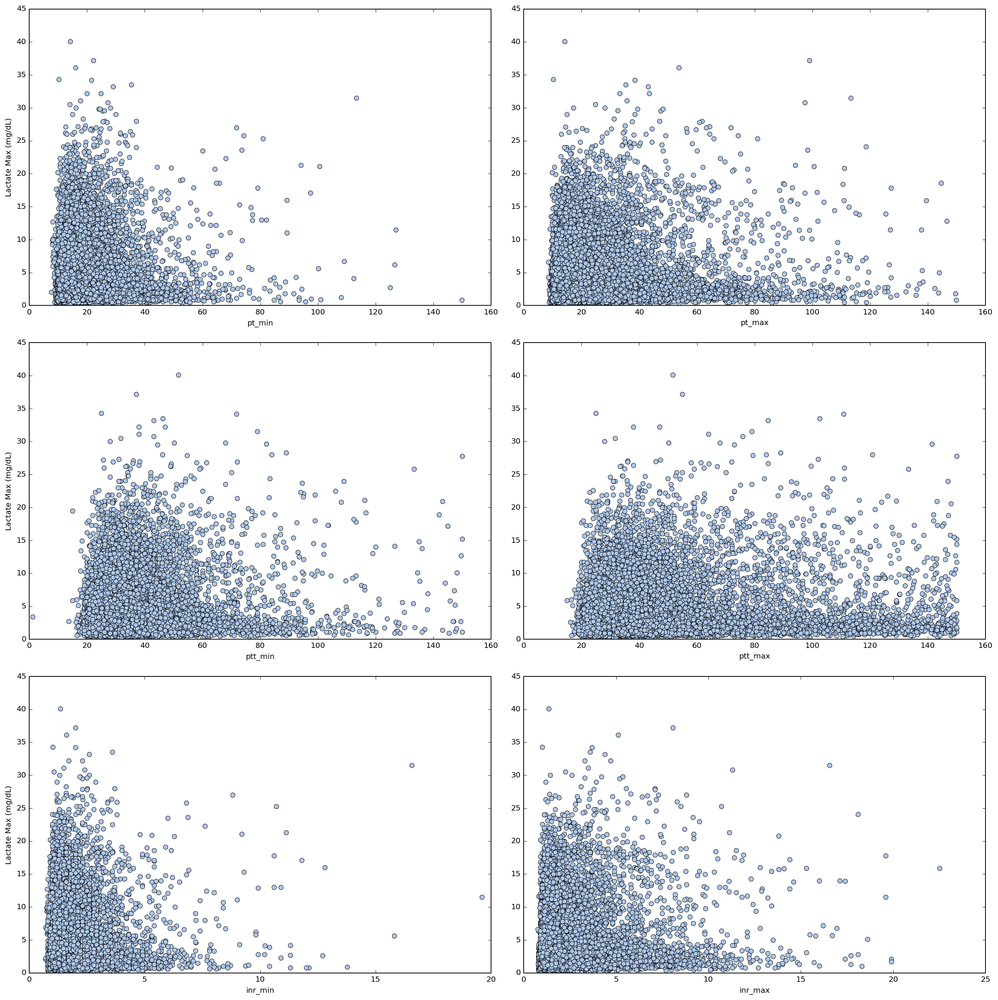

In [41]:
fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize=(18, 18))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)

coag_vars = ['pt_min', 'pt_max', 'ptt_min', 'ptt_max', 'inr_min', 'inr_max']

for i, lab in enumerate(coag_vars):
    axes[i // 2, i % 2].plot(cohort.loc[:, lab], cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
    axes[i // 2, i % 2].set_xlabel(lab)
    axes[i // 2, 0].set_ylabel('Lactate Max (mg/dL)')


plt.show()

In [42]:
cohort.loc[:, coag_vars].corrwith(cohort.loc[:, 'lactate_max'])

pt_min    0.171
pt_max    0.204
ptt_min   0.149
ptt_max   0.163
inr_min   0.175
inr_max   0.208
dtype: float64

Finally, our liver labs, albumin and bilirubin.

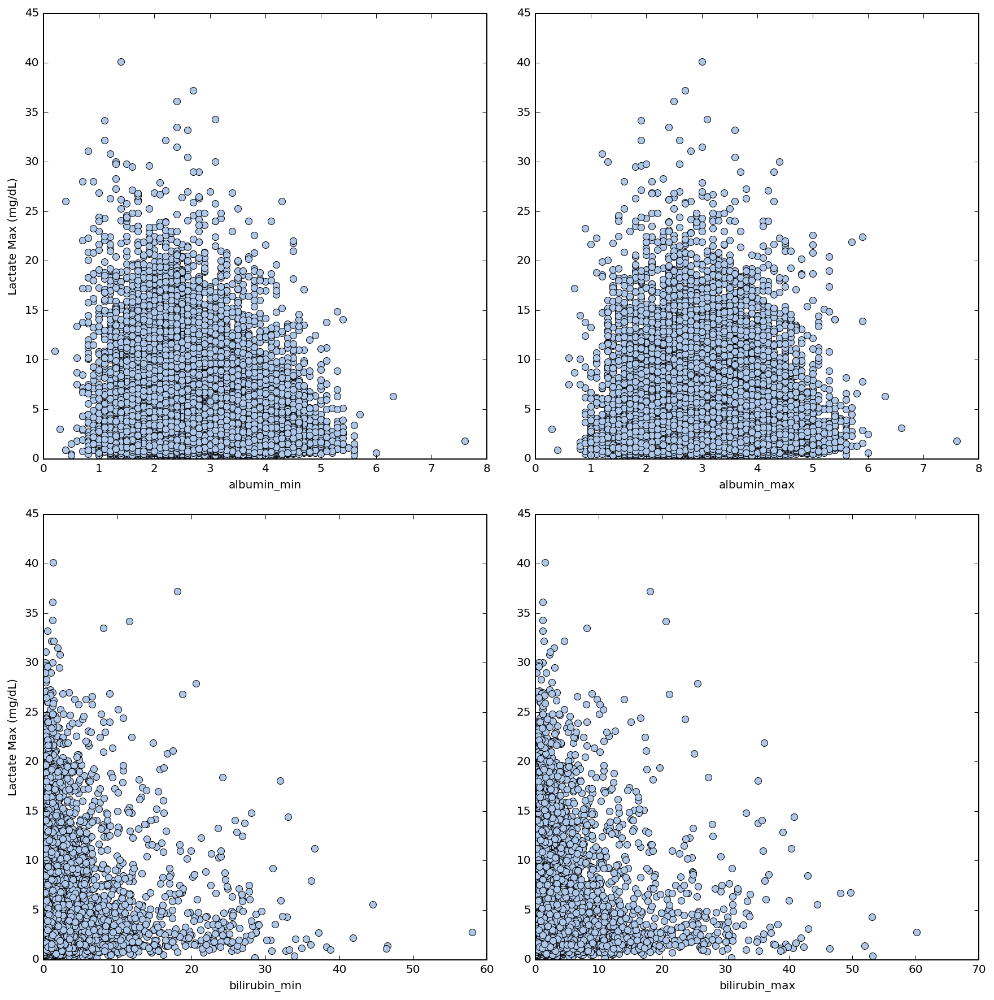

In [43]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize=(12, 12))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)

liver_vars = ['albumin_min', 'albumin_max', 'bilirubin_min', 'bilirubin_max']

for i, lab in enumerate(liver_vars):
    axes[i // 2, i % 2].plot(cohort.loc[:, lab], cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
    axes[i // 2, i % 2].set_xlabel(lab)
    axes[i // 2, 0].set_ylabel('Lactate Max (mg/dL)')


plt.show()

In [44]:
cohort.loc[:, liver_vars].corrwith(cohort.loc[:, 'lactate_max'])

albumin_min     -0.146
albumin_max     -0.063
bilirubin_min    0.130
bilirubin_max    0.159
dtype: float64

The last bit to examine are the demographic features and some of the clinical indicators. We can look at apache score versus lactate maximum, which we often expect to be fairly associated.

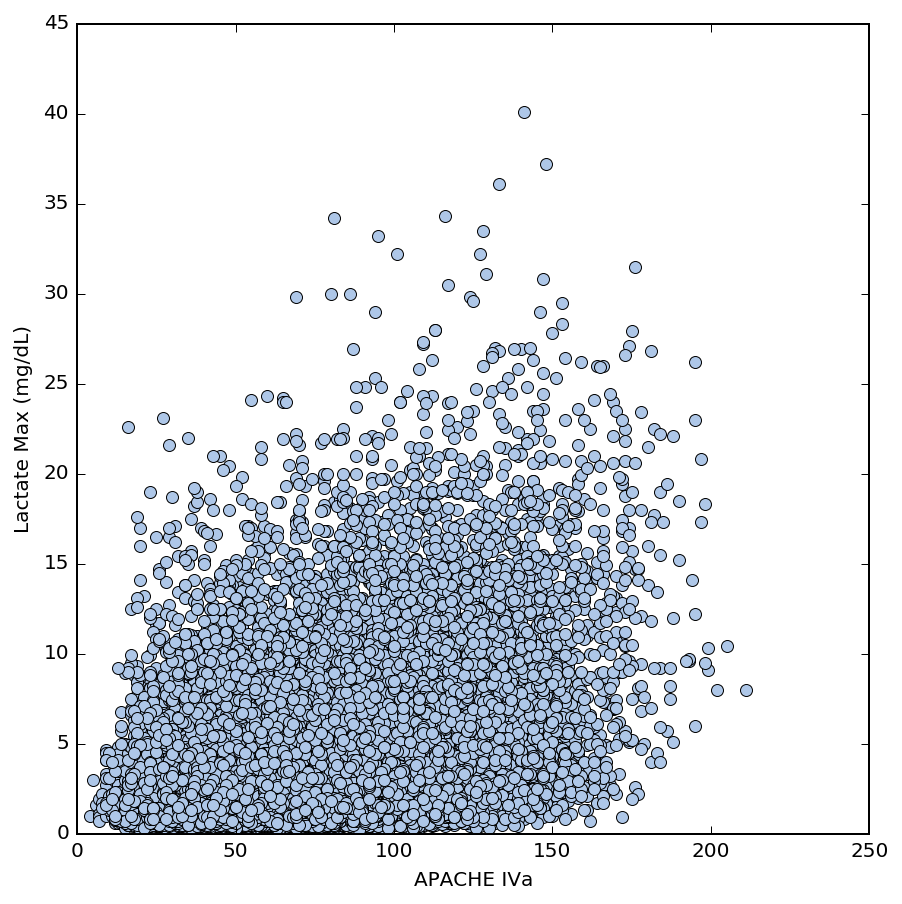

In [45]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize=(6, 6))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)

axes.plot(cohort.loc[:, 'apachescore'], cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes.set_xlabel('APACHE IVa')
axes.set_ylabel('Lactate Max (mg/dL)')

plt.show()

In [46]:
cohort.loc[:, ['apachescore']].corrwith(cohort.loc[:, 'lactate_max'])

apachescore   0.389
dtype: float64

It is not highly correlated, but stronger than many of the other predictors. The patients for which it does not match up are whom we are interested in studying.

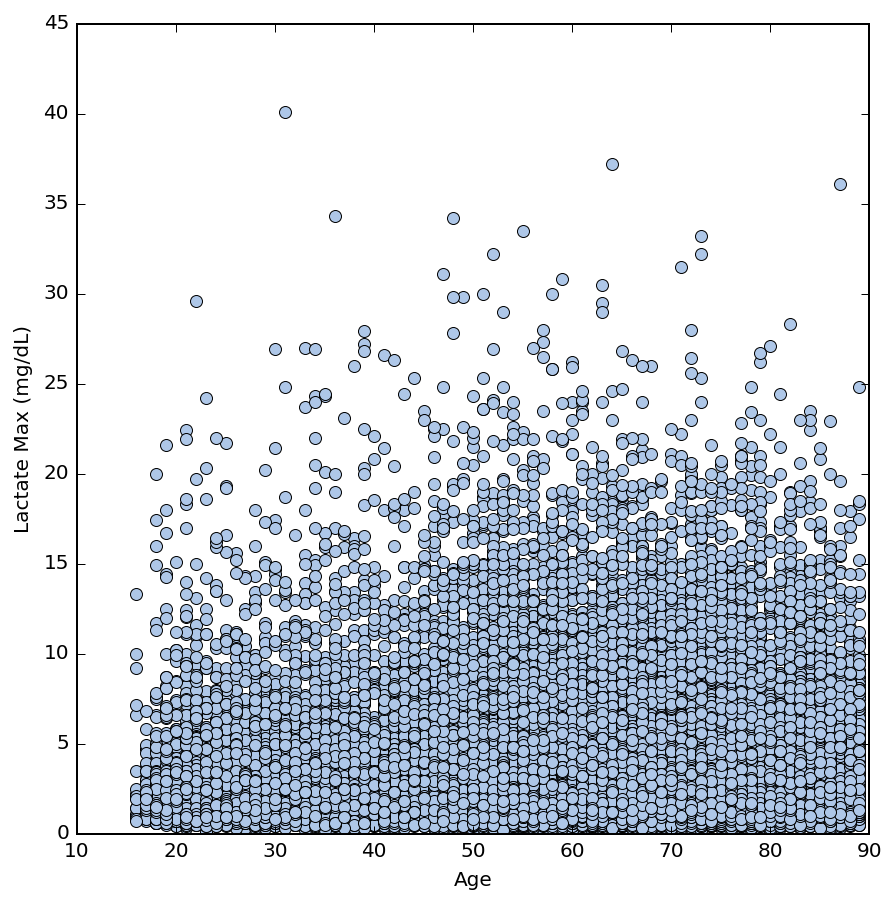

In [47]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize=(6, 6))
plt.tight_layout(pad = 0.4, w_pad = 1.5, h_pad = 3.0)

axes.plot(cohort.loc[:, 'age'], cohort.lactate_max, color = tableau20[1], marker = 'o', linestyle = 'None')
axes.set_xlabel('Age')
axes.set_ylabel('Lactate Max (mg/dL)')

plt.show()

In [48]:
cohort.loc[:, ['age']].corrwith(cohort.loc[:, 'lactate_max'])

age   -0.008
dtype: float64

As we would guess, age has virtually no association. We'll forgoe examining race because the racial distribution is so skewed white that the estimates could be misleading. Finally, we calculate associations for `pressor` and `oobintubday1` using univariate linear regresion models.

In [49]:
glm = LinearRegression()

X = cohort.pressor.values.reshape(cohort.pressor.shape[0], 1)
y = cohort.lactate_max
pressor_coef = glm.fit(X, y).coef_

X = cohort.oobintubday1.values.reshape(cohort.pressor.shape[0], 1)
oobintubday1_coef = glm.fit(X, y).coef_

print('Pressor coefficient: {}'.format(pressor_coef))
print('Mechanical vent coefficient: {}'.format(oobintubday1_coef))

Pressor coefficient: [1.79174164]
Mechanical vent coefficient: [1.46557055]


The unadjusted coefficients shown above suggest both of these are associated with increased maximum lactate levels. These are not interesting findings as they are associated with disease status and are confounded. Because we are simply examining associations we will not build an adjusted model now.

## Conclusion

In summary, we note that many of our variables are weakly associated with lactate levels in some way; there also appears to be differences with respect to disease groups although we have not examined this with statistical rigor. Lactate discordance also appears to capture different populations dependent on how sick the patients are as manifested by various differences in the effect of diseases. Interestingly, some diseases promote discordance in both groups. Because many of them are associated in different ways, it may be reasonable to develop different classifiers for these subpopulations. We note many hypotheses to explore including the dynamics of lactate across certain disease groups which we will examine in future work. For now, we turn to the goal of this project, creating classifiers which flag patients as having discordance between their phenotype and lactate level. Such a classifier has value in flagging patients likely to decompensate (in those who are less ill-appearing), and simultaneously flagging patients who are critically ill in whom lactate levels should not be trusted. 

In [50]:
cohort.to_csv('./cleaned_cohort.csv')